## A UTFVI-Based Look at Urban Heat: Case Study of Bursa City

Izza Prasatya Arief

Urban Thermal Field Variance Index (UTFVI) is a quantitative measurement used to assess thermal stress caused by surface heat, which typically occurs in urban areas. The core theory behind UTFVI is based on the assumption that the higher the surface temperature compared to the area's average, the greater the ecological pressure or thermal stress experienced by that area. UTFVI is highly valuable for quantitatively explaining thermal comfort in urban environments and is widely used in urban climatology studies. This index helps identify areas within a city that experience high thermal stress, which can impact human thermal comfort, public health, and ecosystem sustainability.

This analysis was conducted with GRASS in jupyter notebook, allowing high-level scripting using GRASS tools as well as low-level access through GRASS libraries. The aim of this analysis is to identify districts within the city of Bursa that have high UTFVI values, and to examine how these values correlate with seasons, land cover, land surface temperature, vegetation proportion, and the urban heat island effect. Additionally, the analysis seeks to provide insights into possible solutions for reducing UTFVI levels in highly stressed districts, thereby improving their ecological comfort.

In [6]:
# Import standard python packages
import sys
import subprocess

# Ask GRASS where its Python packages are and add them to the path
grass_call = "grass84"
sys.path.append(
    subprocess.check_output([grass_call, "--config", "python_path"], text=True, shell=True).strip()
)

# Import the GRASS python packages we need
import grass.script as gs
import grass.jupyter as gj

In [2]:
# Launch a GRASS session
gj.init(r"C:\Users\DELL\Documents\grassdata\bursa_uhi_analysis\PROJECT");

In [8]:
# Define the region based on area
gs.parse_command("g.region", vector="bursa_city", flags='pg')

{'projection': '1',
 'zone': '35',
 'n': '4464682.82691508',
 's': '4447711.51204576',
 'w': '653245.52841569',
 'e': '689954.5640709',
 'nsres': '1.00001855',
 'ewres': '1.00000097',
 'rows': '16971',
 'cols': '36709',
 'cells': '622988439'}

In [9]:
# See the raster data in mapset
gs.list_grouped("raster")

{'PROJECT': ['bt_summer_2025',
  'bt_winter_2025',
  'bursa_district',
  'lse_summer_2025',
  'lse_winter_2025',
  'lst_summer_2025',
  'lst_winter_2025',
  'ndvi_summer_2025',
  'ndvi_winter_2025',
  'pv_summer_2025',
  'pv_winter_2025',
  'tc_summer_2025',
  'tc_winter_2025',
  'toa_summer_2025',
  'toa_winter_2025',
  'uhi_summer_2025',
  'uhi_winter_2025',
  'utfvi_summer_2025',
  'utfvi_winter_2025'],
 'PERMANENT': ['LC09_L1TP_180032_20250128_20250128_02_T1_B1',
  'LC09_L1TP_180032_20250128_20250128_02_T1_B10',
  'LC09_L1TP_180032_20250128_20250128_02_T1_B11',
  'LC09_L1TP_180032_20250128_20250128_02_T1_B2',
  'LC09_L1TP_180032_20250128_20250128_02_T1_B3',
  'LC09_L1TP_180032_20250128_20250128_02_T1_B4',
  'LC09_L1TP_180032_20250128_20250128_02_T1_B5',
  'LC09_L1TP_180032_20250128_20250128_02_T1_B6',
  'LC09_L1TP_180032_20250128_20250128_02_T1_B7',
  'LC09_L1TP_180032_20250128_20250128_02_T1_B8',
  'LC09_L1TP_180032_20250128_20250128_02_T1_B9',
  'LC09_L1TP_180032_20250128_2025012

In [10]:
# Enhancing the colors of the RGB bands to create a composite image
dates = {
    "winter": "20250128_20250128",
    "summer": "20250707_20250709"
}
for season, date in dates.items():
    b2 = f"LC09_L1TP_180032_{date}_02_T1_B2"
    b3 = f"LC09_L1TP_180032_{date}_02_T1_B3"
    b4 = f"LC09_L1TP_180032_{date}_02_T1_B4"
    output_tc = f"tc_{season}_2025"
    # Enhance color
    gs.run_command("i.colors.enhance",
                   red=b4,
                   green=b3,
                   blue=b2)
    # Create composite
    gs.run_command("r.composite",
                   red=b4,
                   green=b3,
                   blue=b2,
                   output=output_tc,
                   overwrite=True)
    print(f"Composite for {season} has been created!")

Composite for winter has been created!
Composite for summer has been created!


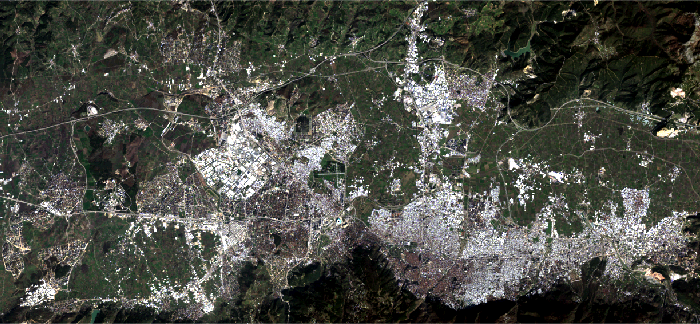

In [11]:
# Visualize the true color image of Bursa City (winter)
tc_winter = gj.Map(use_region=True, width=700)
tc_winter.d_rast(map="tc_winter_2025")
tc_winter.show()

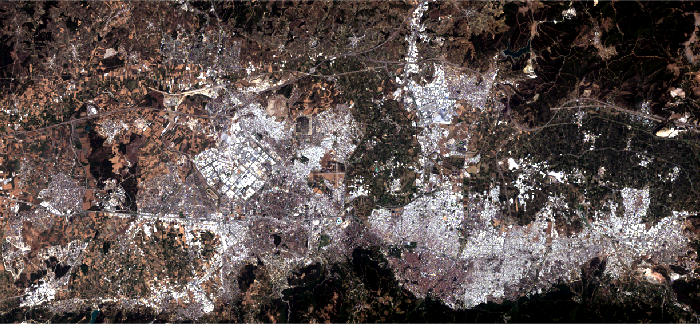

In [12]:
# Visualize the true color image of Bursa City (summer)
tc_summer = gj.Map(use_region=True, width=700)
tc_summer.d_rast(map="tc_summer_2025")
tc_summer.show()

Land cover in Bursa varies significantly between seasons. The top image shows the city during winter, while the bottom image shows it during summer. Bursa appears greener in winter due to its Mediterranean climate, which features wet winters. During this time, wild grasses and ground-cover plants flourish as humidity increases, even though the temperatures are lower. Large areas of agricultural land are planted with crops such as wheat and barley, which begin to grow in late autumn and reach their lush green state in winter—explaining the greener appearance of Bursa in that season.

In contrast, during summer, wheat and barley are typically harvested, leaving fields temporarily bare and fallow. The hot and dry nature of Mediterranean summers also contributes to the more brownish and arid appearance in the summer imagery. Natural vegetation and non-irrigated plants tend to dry out, wilt, or die, further intensifying the contrast between the greener winter and the drier summer landscape.

To calculate the UTFVI index, several data preparation steps and pre-calculations are required. Landsat 8/9 imagery is suitable for this analysis because it includes a thermal band—specifically Band 10. Meanwhile, Bands 4 and 5 are used to calculate the Normalized Difference Vegetation Index (NDVI), which is essential for determining the Proportion of Vegetation (PV). PV is then used to calculate Land Surface Emissivity (LSE), which is a crucial component in computing Land Surface Temperature (LST), the main input for UTFVI calculation. A detailed explanation of the UTFVI calculation process can be found in Avdan & Jovanovska (2016).

### Top of Atmospheric (TOA) Spectral Radiance (Lλ)

Top of Atmosphere (TOA) Spectral Radiance, or Atmospheric Upper Reflection Value, refers to electromagnetic energy reflected or emitted beyond the Earth's atmosphere, from the Earth's surface and through the atmosphere. TOA Spectral Radiance is measured in W/(m²·sr·μm). The formula for calculating TOA Spectral Radiance is as follow.

$$
L_\lambda = M_L \cdot Q_{cal} + A_L
$$

- $L_\lambda$ = Top of Atmospheric Spectral Radiance (W/(m²·sr·μm))  
- $M_L$ = Band-specific multiplicative rescaling factor  
- $Q_{cal}$ = Landsat 8/9 Band 10 image  
- $A_L$ = Band-specific additive rescaling factor

In [13]:
# Top of Atmospheric spectral radiance calculation
ml = 3.8000E-04
al = 0.10000

for season, date in dates.items():
    b10 = f"LC09_L1TP_180032_{date}_02_T1_B10"
    output_toa = f"toa_{season}_2025"
    expr_toa = f"{output_toa} = {ml} * {b10} + {al}"
    gs.run_command("r.mapcalc",
               expression=expr_toa,
               overwrite=True)
    gs.run_command("r.colors",
               map=output_toa,
               color="viridis",
               flags='e',
               overwrite=True)
    print(f"TOA Radiance for {season} has been calculated!")

TOA Radiance for winter has been calculated!
TOA Radiance for summer has been calculated!


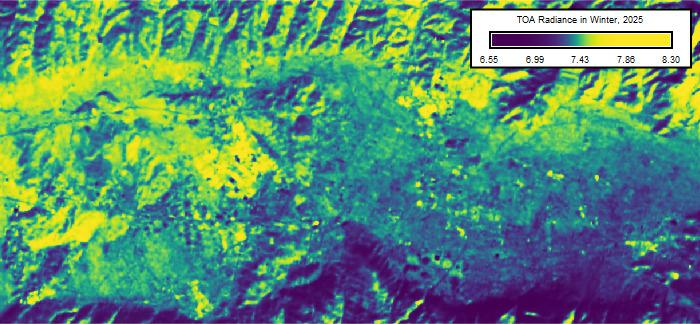

In [14]:
# Visualize the TOA radiance image (winter)
toa_winter = gj.Map(use_region=True, width=700)
toa_winter.d_rast(map="toa_winter_2025")
toa_winter.d_legend(raster="toa_winter_2025",
             title="TOA Radiance in Winter, 2025",
             at=(85,90,70,96),
             flags='b')
toa_winter.show()

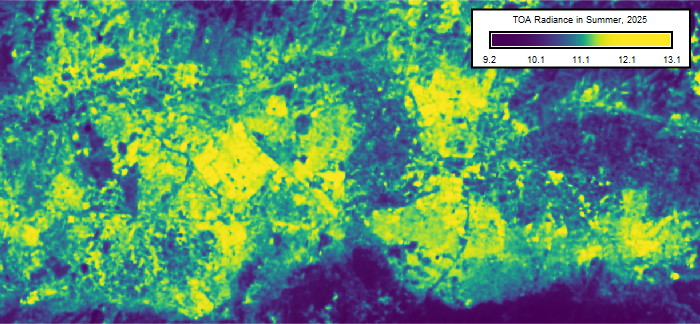

In [32]:
# Visualize the TOA radiance image (summer)
toa_summer = gj.Map(use_region=True, width=700)
toa_summer.d_rast(map="toa_summer_2025")
toa_summer.d_legend(raster="toa_summer_2025",
             title="TOA Radiance in Summer, 2025",
             at=(85,90,70,96),
             flags='b')
toa_summer.show()

During winter, the pixels in the raster emit or absorb radiation with an intensity ranging from approximately 6.55 to 8.30 W/(m²·sr·μm). In contrast, during summer, the radiation intensity increases, ranging from 9.2 to 13.1 W/(m²·sr·μm). This Top of Atmospheric (TOA) Radiance is derived from the thermal band (Band 10) and is used as an input before being converted into Land Surface Temperature (LST).

### Brightness Temperature (BT)

Brightness Temperature is the electromagnetic radiation emitted upward from the top of the Earth's atmosphere (Latif, 2014). It is a pseudo-temperature calculated from the electromagnetic radiation energy detected by the satellite sensor in the thermal band. Its unit is directly measured in Kelvin. But the formula below convert the Brightness Temperature into °C.

$$
BT = \left( \frac{K_2}{\ln\left( \frac{K_1}{L_\lambda} + 1 \right)} \right) - 273.15
$$

- $BT$ = Brightness Temperature
- $K_1$ & $K_2$ = Thermal constant for Landsat 8/9 Band 10

In [15]:
# Brightness temperature calculation
k1 = 799.0284 # constant for landsat 8/9 thermal band (band 10)
k2 = 1329.2405 # constant for landsat 8/9 thermal band (band 10)

for season, date in dates.items():
    output_toa = f"toa_{season}_2025"
    output_bt = f"bt_{season}_2025"
    expr_bt = f"{output_bt} = ({k2} / log(({k1} / {output_toa}) + 1)) - 273.15" # Convert to °C
    gs.run_command("r.mapcalc",
               expression=expr_bt,
               overwrite=True)
    gs.run_command("r.colors",
               map=output_bt,
               color="bcyr",
               flags='e',
               overwrite=True)
    print(f"Brightness Temperature for {season} has been calculated!")

Brightness Temperature for winter has been calculated!
Brightness Temperature for summer has been calculated!


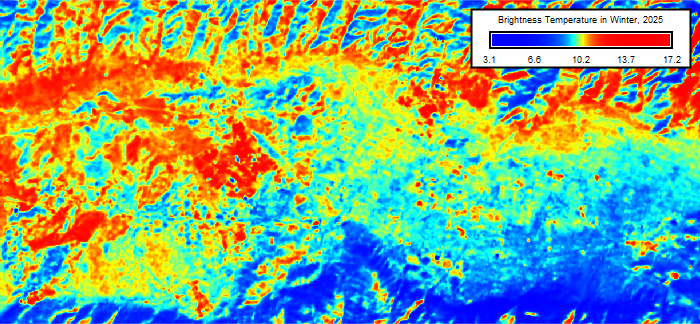

In [16]:
# Visualize the brightness temperature map (winter)
bt_winter = gj.Map(use_region=True, width=700)
bt_winter.d_rast(map="bt_winter_2025")
bt_winter.d_legend(raster="bt_winter_2025",
             title="Brightness Temperature in Winter, 2025",
             at=(85,90,70,96),
             flags='b')
bt_winter.show()

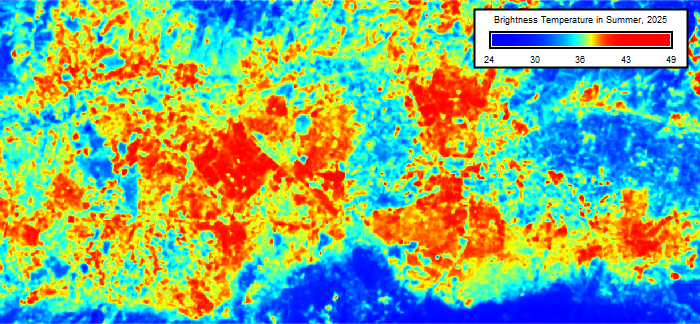

In [17]:
# Visualize the brightness temperature map (summer)
bt_summer = gj.Map(use_region=True, width=700)
bt_summer.d_rast(map="bt_summer_2025")
bt_summer.d_legend(raster="bt_summer_2025",
             title="Brightness Temperature in Summer, 2025",
             at=(85,90,70,96),
             flags='b')
bt_summer.show()

Areas with low Brightness Temperature (BT) values indicate “cool areas,” such as water bodies, vegetation, or shadows. On the other hand, high BT values represent “hot areas,” like concrete, asphalt, rooftops, open spaces, or bare soil. Notice the spatial difference of BT between two different seasons. But it is important to remember that BT is a pseudo-temperature because it has not yet been corrected for emissivity and atmospheric effects.

### Normalized Difference Vegetation Index

The Normalized Difference Vegetation Index (NDVI) is a remote sensing-based vegetation index that serves as a valuable tool for assessing and monitoring vegetation conditions in a given area.

$$
NDVI = \frac{NIR - RED}{NIR + RED}
$$

where:
- $NIR$ = Reflectance in the near-infrared band (Band 5 for Landsat 8/9)
- $RED$ = Reflectance in the red band (Band 4 for Landsat 8/9)

In [18]:
# NDVI calculation
for season, date in dates.items():
    b4 = f"LC09_L1TP_180032_{date}_02_T1_B4"
    b5 = f"LC09_L1TP_180032_{date}_02_T1_B5"
    gs.run_command("i.vi",
               output=f"ndvi_{season}_2025",
               viname="ndvi",
               red=b4,
               nir=b5,
               overwrite=True)
    print(f"NDVI for {season} has been calculated!")

NDVI for winter has been calculated!
NDVI for summer has been calculated!


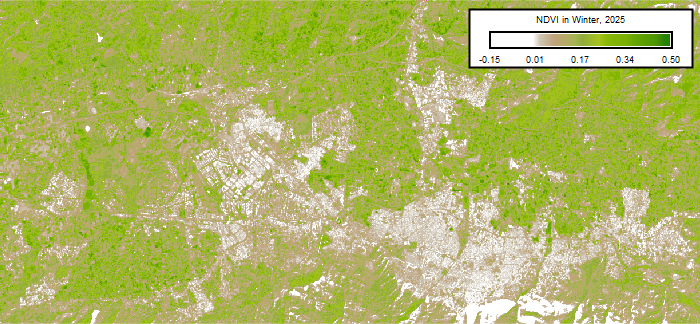

In [19]:
# Visualize the NDVI map (winter)
ndvi_winter = gj.Map(use_region=True, width=700)
ndvi_winter.d_rast(map="ndvi_winter_2025")
ndvi_winter.d_legend(raster="ndvi_winter_2025",
             title="NDVI in Winter, 2025",
             at=(85,90,70,96),
             flags='b')
ndvi_winter.show()

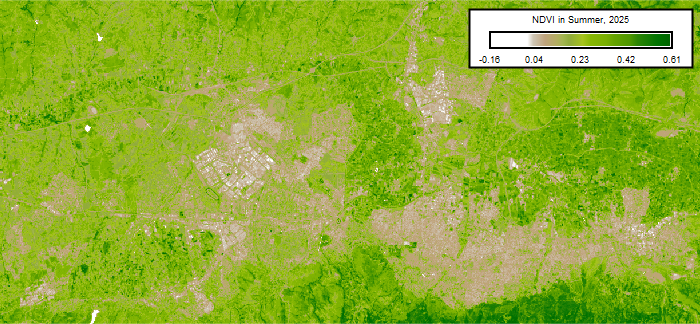

In [20]:
# Visualize the NDVI map (summer)
ndvi_summer = gj.Map(use_region=True, width=700)
ndvi_summer.d_rast(map="ndvi_summer_2025")
ndvi_summer.d_legend(raster="ndvi_summer_2025",
             title="NDVI in Summer, 2025",
             at=(85,90,70,96),
             flags='b')
ndvi_summer.show()

During winter in Bursa City, NDVI values range from -0.15 to 0.50. These low values are likely caused by thin snow cover or high soil moisture, both of which reduce near-infrared (NIR) reflectance. In summer, the NDVI values are slightly higher, ranging from -0.16 to 0.61. However, these values still indicate sparse to moderate vegetation.

### Proportion of Vegetation (Pv)

Proportion of Vegetation (Pv), also known as the Vegetation Cover Ratio, is an effective indicator for measuring the amount of vegetation cover in a given area. Pv values range from 0 to 1, with higher values indicating denser vegetation. Pv is commonly used in the calculation of emissivity, which plays a crucial role in correcting Land Surface Temperature (LST) values to more accurately estimate temperature from satellite imagery.

$$
P_v = \left(\frac{NDVI - NDVI_s}{NDVI_v - NDVI_s}\right)^2
$$

where:
- $P_v$ = Proportion of vegetation
- $NDVI$ = Normalized Difference Vegetation Index
- $NDVI_v$ = Maximum value of NDVI
- $NDVI_s$ = Minimum value of NDVI

In [21]:
# Proportion of vegetation (Pv) calculation using season-specific NDVI min/max
for season, date in dates.items():
    output_ndvi = f"ndvi_{season}_2025"
    output_pv = f"pv_{season}_2025"
    # Get NDVI min/max for this season
    ndvi_info = gs.parse_command("r.univar",
                                 map=output_ndvi,
                                 flags='g')
    ndvi_min = float(ndvi_info["min"])
    ndvi_max = float(ndvi_info["max"])
    print(f"{season.capitalize()} NDVI min: {ndvi_min:.2f}, max: {ndvi_max:.2f}")
    # Pv formula
    expr_pv = (f"{output_pv} = pow(({output_ndvi} - {ndvi_min}) / ({ndvi_max} - {ndvi_min}), 2)")
    # Calculate Pv
    gs.run_command("r.mapcalc",
                   expression=expr_pv,
                   overwrite=True)
    # Apply color
    gs.run_command("r.colors",
                   map=output_pv,
                   color="gyr",
                   flags='en')
    print(f"Proportion of vegetation for {season} has been calculated!")

Winter NDVI min: -0.15, max: 0.50
Proportion of vegetation for winter has been calculated!
Summer NDVI min: -0.16, max: 0.61
Proportion of vegetation for summer has been calculated!


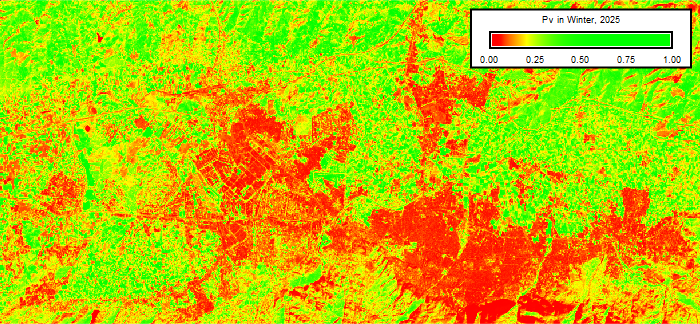

In [22]:
# Visualize the proportion of vegetation map (winter)
pv_winter = gj.Map(use_region=True, width=700)
pv_winter.d_rast(map="pv_winter_2025")
pv_winter.d_legend(raster="pv_winter_2025",
             title="Pv in Winter, 2025",
             at=(85,90,70,96),
             flags='b')
pv_winter.show()

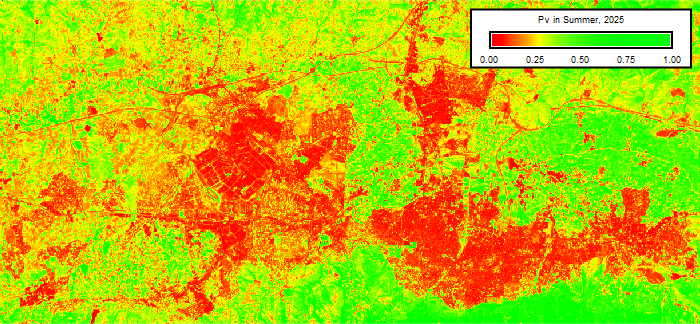

In [23]:
# Visualize the proportion of vegetation map (summer)
pv_summer = gj.Map(use_region=True, width=700)
pv_summer.d_rast(map="pv_summer_2025")
pv_summer.d_legend(raster="pv_summer_2025",
             title="Pv in Summer, 2025",
             at=(85,90,70,96),
             flags='b')
pv_summer.show()

The interpretation of Pv (Proportion of Vegetation) values is as follows:

0 indicates no vegetation cover

1 means the pixel is fully covered by vegetation

The closer a pixel's Pv value is to 1, the denser the vegetation it represents. Pv is a commonly used calculation in remote sensing, particularly as an input for estimating emissivity (ε). Emissivity is then used to correct Land Surface Temperature (LST) values, allowing for more accurate temperature estimations from satellite imagery.

### Land Surface Emissivity (ε)

Land surface emissivity (LSE), or emission ratio, is a proportionality factor that adjusts blackbody radiation according to Planck’s law, and it represents the efficiency of thermal energy transfer from the Earth's surface to the atmosphere (Avdan & Jovanovska, 2016). The formula used in this analysis is considered appropriate for medium-resolution imagery, such as the 30-meter resolution provided by Landsat satellite imagery. The equation for land surface emissivity is as follows.

$$
\varepsilon = \varepsilon_v \cdot P_v + \varepsilon_s (1 - P_v) + d\varepsilon
$$

where:
- $\varepsilon$ = Land surface emissivity (LSE)
- $\varepsilon_v$ = Vegetation emissivity
- $P_v$ = Proportion of vegetation
- $\varepsilon_s$ = Soil emissivity
- $1 - P_v$ = Soil proportion or non-vegetation
- $d\varepsilon$ = Emissivity correction

However, a simpler land surface emissivity equation can also be used. Unlike the formula above, which explicitly combines the vegetation and soil emissivity plus $d\varepsilon$'s correction, the simple linear model below is derived from observations and empirical calibration based on literature for a specific region, in this case Bursa.

$$
\varepsilon = 0.004 \cdot P_v + 0.986
$$

In [24]:
# Land surface emissivity calculation
for season, date in dates.items():
    output_lse = f"lse_{season}_2025"
    output_pv = f"pv_{season}_2025"
    expr_lse = f"{output_lse} = 0.004 * {output_pv} + 0.986"
    gs.run_command("r.mapcalc",
               expression=expr_lse,
               overwrite=True)
    gs.run_command("r.colors",
               map=output_lse,
               color="grey",
               flags="e")
    print(f"Land surface emissivity for {season} has been calculated!")

Land surface emissivity for winter has been calculated!
Land surface emissivity for summer has been calculated!


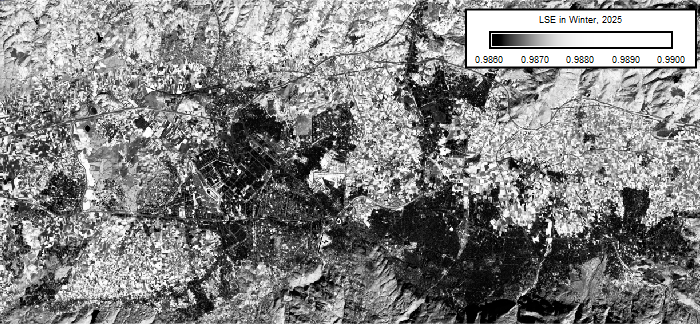

In [25]:
# Visualize the emissivity map (winter)
lse_winter = gj.Map(use_region=True, width=700)
lse_winter.d_rast(map="lse_winter_2025")
lse_winter.d_legend(raster="lse_winter_2025",
             title="LSE in Winter, 2025",
             at=(85,90,70,96),
             flags='b')
lse_winter.show()

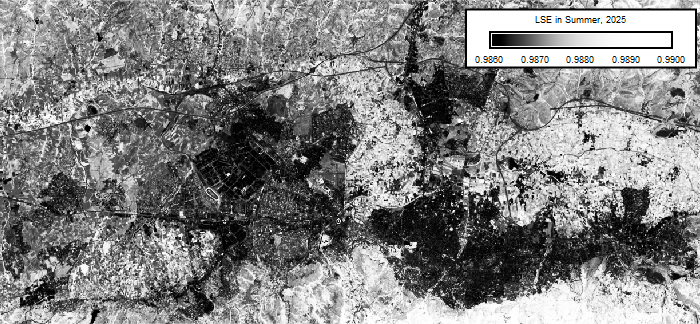

In [26]:
# Visualize the emissivity map (summer)
lse_summer = gj.Map(use_region=True, width=700)
lse_summer.d_rast(map="lse_summer_2025")
lse_summer.d_legend(raster="lse_summer_2025",
             title="LSE in Summer, 2025",
             at=(85,90,70,96),
             flags='b')
lse_summer.show()

Vegetation typically has a high emissivity, ranging from approximately 0.985 to 0.99, while rocky soils, barren land, or built-up areas generally exhibit lower emissivity values, around 0.96

### Land Surface Temperature (LST)

Land Surface Temperature provides information about high and low temperatures on the Earth's surface. It is important to note that Land Surface Temperature is different from air temperature because Land Surface Temperature is a measure of whether the Earth's surface feels warm or cool to the touch. In addition, the fact that land heats up and cools down more quickly also distinguishes it from air temperature. The unit is in °C.

$$
LST = \frac{BT}{1 + \left( \frac{0.00115 \times BT}{1.4388} \right) \ln(\varepsilon)}
$$


where:
- $LST$ = Land surface temperature
- $BT$ = Brightness temperature
- $\varepsilon$ = Land surface emissivity

In [27]:
# Land surface temperature calculation
for season, date in dates.items():
    output_lst = f"lst_{season}_2025"
    output_bt = f"bt_{season}_2025"
    output_lse = f"lse_{season}_2025"
    expr_lst = f"{output_lst} = {output_bt} / (1 + (0.00115 * {output_bt} / 1.4388) * log({output_lse}))"
    gs.run_command("r.mapcalc",
                   expression=expr_lst,
                   overwrite=True)
    gs.run_command("r.colors",
                   map=output_lst,
                   color="bcyr",
                   flags="e")
    print(f"Land surface temperature for {season} has been calculated!")

Land surface temperature for winter has been calculated!
Land surface temperature for summer has been calculated!


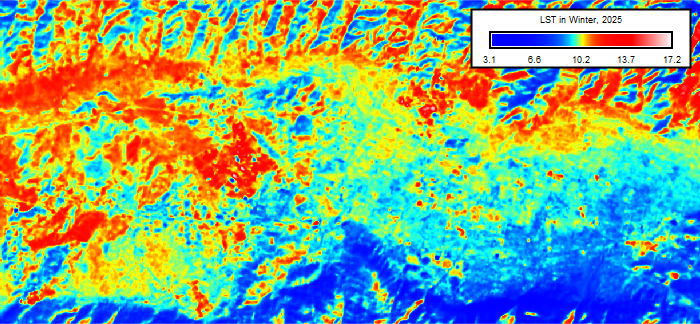

In [28]:
# Visualize the LST map (winter)
lst_winter = gj.Map(use_region=True, width=700)
lst_winter.d_rast(map="lst_winter_2025")
lst_winter.d_legend(raster="lst_winter_2025",
             title="LST in Winter, 2025",
             at=(85,90,70,96),
             flags='b')
lst_winter.show()

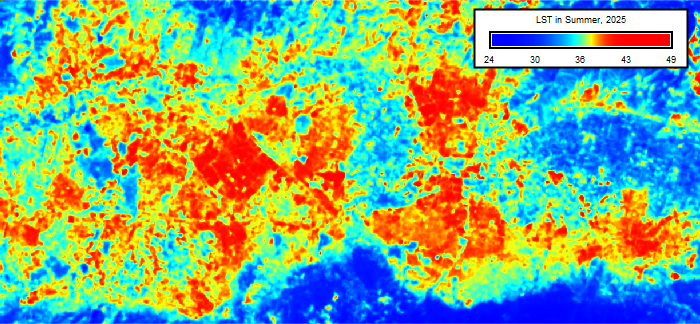

In [29]:
# Visualize the LST map (summer)
lst_summer = gj.Map(use_region=True, width=700)
lst_summer.d_rast(map="lst_summer_2025")
lst_summer.d_legend(raster="lst_summer_2025",
             title="LST in Summer, 2025",
             at=(85,90,70,96),
             flags='b')
lst_summer.show()

One thing to remember is that land surface temperature (LST) refers to the temperature of the Earth's surface, not the air temperature. LST is highly influenced by land cover type, with built-up areas typically showing higher surface temperatures. In regions with extensive built-up land cover, especially during hot seasons like summer, high LST combined with high air temperatures can lead to thermal discomfort in humans—such as feelings of heat stress, fatigue, and dehydration. When this happens, walkability and outdoor activities tend to decrease.

Therefore, LST is a crucial variable in studies of the urban heat island effect, local climate change, green space planning, and even serves as an important input for evapotranspiration models and surface energy balance analyses in hydrological studies.

In [30]:
# Average LST Extraction
for season, date in dates.items():
    output_lst = f"lst_{season}_2025"
    lst_info = gs.parse_command("r.univar",
                                map=output_lst,
                                flags='g')
    lst_mean = float(lst_info["mean"])
    print(f"Average Land Surface Temperature in {season} 2025: {lst_mean:.2f}°C")

Average Land Surface Temperature in winter 2025: 9.77°C
Average Land Surface Temperature in summer 2025: 35.94°C


### Urban Heat Island (Normalized)

Urban Heat Island (UHI) can be continuously monitored using satellite data. Rather than relying solely on point-based temperature readings from suburban to urban areas within a city, remote sensing-based UHI analysis allows for the visualization of heat stress intensity across large geographic regions (Waleed et al., 2023).

One advantage of using Normalized UHI is that it enables spatial classification of UHI without the need to define a rural reference area, making it especially suitable for raster-based mapping. This method uses a statistical approach to evaluate how high or low the Land Surface Temperature (LST) is in each pixel relative to the overall city average. Normalized UHI is also known as the z-score, which indicates how far a value deviates from the mean.

$$
UHI_N = \frac{T_s - T_m}{T_{std}}
$$

where:
- $UHI_N$ = Normalized urban heat island
- $T_s$ = Land surface temperature (LST)
- $T_m$ = Mean LST of study area
- $T_{std}$ = Standard deviation LST of study area

In [31]:
# Remote sensing-based urban heat island (UHI) calculation
for season, date in dates.items():
    output_lst = f"lst_{season}_2025"
    output_uhi = f"uhi_{season}_2025"
    # Get stats from LST raster
    lst_info = gs.parse_command("r.univar",
                                map=output_lst,
                                flags='g')
    lst_mean = float(lst_info["mean"])
    lst_stdev = float(lst_info["stddev"])
    # UHI normalization formula
    expr_uhi = f"{output_uhi} = ({output_lst} - {lst_mean}) / {lst_stdev}"
    # Run mapcalc and colorize
    gs.run_command("r.mapcalc",
                   expression=expr_uhi,
                   overwrite=True)
    gs.run_command("r.colors",
                   map=output_uhi,
                   color="bgyr",  # blue-green-yellow-red
                   flags='e')
    print(f"UHI Normalized for {season} has been calculated!")


UHI Normalized for winter has been calculated!
UHI Normalized for summer has been calculated!


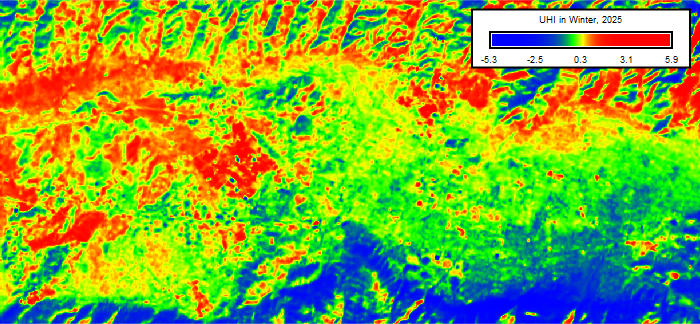

In [32]:
# Visualize the UHI map (winter)
uhi_winter = gj.Map(use_region=True, width=700)
uhi_winter.d_rast(map="uhi_winter_2025")
uhi_winter.d_legend(raster="uhi_winter_2025",
             title="UHI in Winter, 2025",
             at=(85,90,70,96),
             flags='b')
uhi_winter.show()

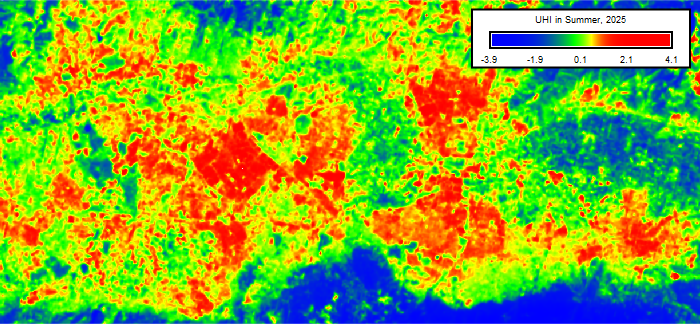

In [33]:
# Visualize the UHI map (summer)
uhi_summer = gj.Map(use_region=True, width=700)
uhi_summer.d_rast(map="uhi_summer_2025")
uhi_summer.d_legend(raster="uhi_summer_2025",
             title="UHI in Summer, 2025",
             at=(85,90,70,96),
             flags='b')
uhi_summer.show()

Areas with Normalized UHI values below 0 are relatively cooler, often correlating with land cover types such as vegetation, water bodies, and similar features. In contrast, areas with Normalized UHI values above 0 are somewhat warmer than the city average, while values greater than 1 indicate areas that are significantly hotter. These hotter zones typically correlate with built-up areas, barren land, or sparsely vegetated surfaces.

### Urban Thermal Field Variance Index (UTFVI)

UTFVI is a measure used to quantitatively describe the thermal comfort level in a city and is among the most commonly used thermal comfort indices (Guha et al., 2018; Kafy et al., 2021). UTFVI can also be used to assess the ecological status of an area.

$$
UTFVI = \frac{T_s - T_m}{T_m}
$$

where:
- $T_s$ = Land surface temperature (LST)
- $T_m$ = Mean LST of study area

In [34]:
# UTFVI calculation
for season, date in dates.items():
    output_utfvi = f"utfvi_{season}_2025"
    output_lst = f"lst_{season}_2025"
    lst_info = gs.parse_command("r.univar",
                                map=output_lst,
                                flags='g')
    lst_mean = float(lst_info["mean"])
    expr_utfvi = (f"{output_utfvi} = ({output_lst} - {lst_mean}) / {lst_mean}")
    gs.run_command("r.mapcalc",
                   expression=expr_utfvi,
                   overwrite=True)
    gs.run_command("r.colors",
                   map=output_utfvi,
                   color="bcyr",
                   flags='e')
    print(f"Urban Thermal Field Variance Index for {season} has been calculated!")

Urban Thermal Field Variance Index for winter has been calculated!
Urban Thermal Field Variance Index for summer has been calculated!


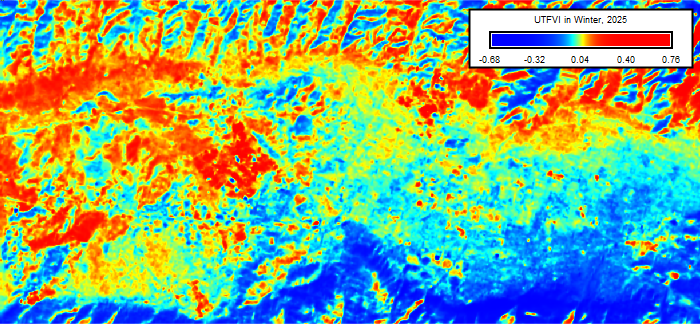

In [35]:
# Visualize the UTFVI map (winter)
utfvi_winter = gj.Map(use_region=True, width=700)
utfvi_winter.d_rast(map="utfvi_winter_2025")
utfvi_winter.d_legend(raster="utfvi_winter_2025",
             title="UTFVI in Winter, 2025",
             at=(85,90,70,96),
             flags='b')
utfvi_winter.show()

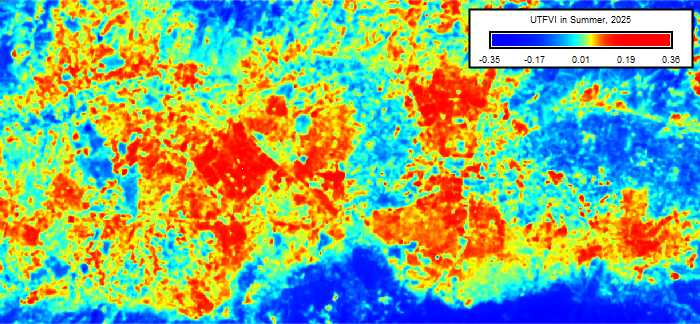

In [36]:
# Visualize the UTFVI map (summer)
utfvi_summer = gj.Map(use_region=True, width=700)
utfvi_summer.d_rast(map="utfvi_summer_2025")
utfvi_summer.d_legend(raster="utfvi_summer_2025",
             title="UTFVI in Summer, 2025",
             at=(85,90,70,96),
             flags='b')
utfvi_summer.show()

### Ecological Evaluation for Bursa City

Urban Thermal Field Variance Index (UTFVI) can be used to quantitatively described the Urban Heat Island (UHI) phenomenon that occurs on specific areas. Generally, areas with UTFVI value <= 0.005 have excellent ecological evaluation because of the lack of UHI phenomenon. While areas with UTFVI value around 0.005 - 0.010 have normal ecological evaluation, and areas with more than 0.010 UTFVI value indicate strong UHI phenomenon, which is not suitable for living ecologically.

| UTFVI Range           | UHI Phenomenon      | Ecological Evaluation |
|-----------------------|---------------------|-----------------------|
| < 0                   | None                | Excellent             |
| 0 – 0.0049            | Weak                | Good                  |
| 0.005 – 0.0099        | Middle              | Normal                |
| 0.010 – 0.0149        | Strong              | Bad                   |
| 0.015 – 0.0199        | Stronger            | Worse                 |
| ≥ 0.020               | Strongest           | Worst                 |

In [37]:
import grass.script.array as garray
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from io import StringIO
import seaborn as sns

#### Winter 2025 Analysis

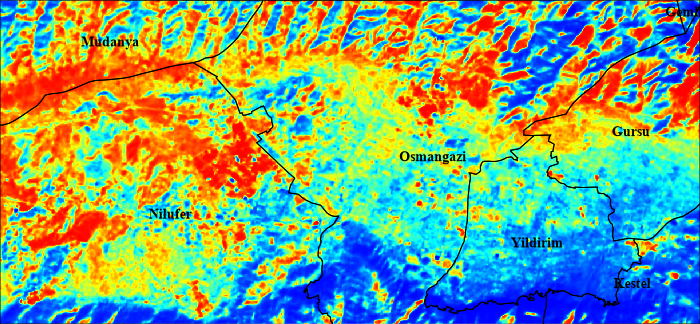

In [39]:
# Visualize the UTFVI map for winter and Bursa City's district
map_winter = gj.Map(use_region=True, width=700)
map_winter.d_rast(map="utfvi_winter_2025")
map_winter.d_vect(map="bursa_district",
                  color="black",
                  fill_color="none",
                  attribute_column="NAME",
                  width=1,
                  label_color="black",
                  label_size=10,
                  font="timesbd",
                  xref="center",
                  yref="center")
map_winter.show()

In [40]:
# Rasterize district's polygon
gs.run_command("v.to.rast",
               input="bursa_district",
               output="bursa_district",
               use="cat",  # Uses the internal category number (unique per polygon)
               overwrite=True)

In [41]:
# Get vector attributes
attributes = gs.read_command("v.db.select",
                             map="bursa_district",
                             columns="cat,NAME",
                             separator="comma",
                             format="csv")
df_names = pd.read_csv(StringIO(attributes))
df_names

,cat,NAME
0,1,Yildirim
1,2,Gursu
2,3,Gemlik
3,4,Osmangazi
4,5,Mudanya
5,6,Nilufer
6,7,Kestel


In [42]:
# Get zonal statistics from GRASS
stats_winter = gs.read_command("r.univar",
                               flags="t",
                               map="utfvi_winter_2025",
                               zones="bursa_district",
                               separator="comma")
df_stats_winter = pd.read_csv(StringIO(stats_winter))

# Get district names
attributes_winter = gs.read_command("v.db.select",
                             map="bursa_district",
                             columns="cat,NAME",
                             separator="comma",
                             format="csv")
df_names_winter = pd.read_csv(StringIO(attributes_winter))

# Merge stats with names
df_final_winter = pd.merge(df_stats_winter,
                           df_names_winter,
                           left_on="zone",  # From r.univar output
                           right_on="cat",  # From v.db.select
                           how="left")
df_final_winter

,zone,label,non_null_cells,null_cells,min,max,range,mean,mean_of_abs,stddev,variance,coeff_var,sum,sum_abs,cat,NAME
0,1,NaN,59087884,0,-0.681009,0.227840,0.908850,-0.078745,0.090125,0.100950,0.010191,-128.198358,-4.652893e+06,5.325319e+06,1,Yildirim
1,2,NaN,61322111,0,-0.460421,0.571073,1.031494,0.019809,0.081074,0.113403,0.012860,572.476057,1.214743e+06,4.971638e+06,2,Gursu
2,3,NaN,1204259,0,-0.420834,0.219472,0.640306,-0.143432,0.162322,0.123003,0.015130,-85.756885,-1.727295e+05,1.954783e+05,3,Gemlik
3,4,NaN,227790322,0,-0.669187,0.707421,1.376608,-0.006520,0.092377,0.130315,0.016982,-1998.620512,-1.485246e+06,2.104258e+07,4,Osmangazi
4,5,NaN,53656365,0,-0.225844,0.434234,0.660078,0.061125,0.092793,0.092196,0.008500,150.830997,3.279748e+06,4.978951e+06,5,Mudanya
5,6,NaN,193913369,0,-0.519764,0.764083,1.283847,0.033520,0.087984,0.109195,0.011924,325.764857,6.499899e+06,1.706131e+07,6,Nilufer
6,7,NaN,25608849,0,-0.601901,0.426050,1.027952,-0.183715,0.196865,0.142896,0.020419,-77.781251,-4.704728e+06,5.041475e+06,7,Kestel


In [43]:
# Visualize only selected column
df_result_winter = df_final_winter[["cat", "NAME", "mean"]].copy()
df_result_winter

,cat,NAME,mean
0,1,Yildirim,-0.078745
1,2,Gursu,0.019809
2,3,Gemlik,-0.143432
3,4,Osmangazi,-0.006520
4,5,Mudanya,0.061125
5,6,Nilufer,0.033520
6,7,Kestel,-0.183715


In [44]:
# UHI phenomenon based on UTFVI value
def classify_utfvi(value):
    if value < 0:
        return "Low"
    elif 0 < value < 0.005:
        return "Weak"
    elif 0.005 <= value < 0.010:
        return "Middle"
    elif 0.010 <= value < 0.015:
        return "Strong"
    elif 0.015 <= value < 0.020:
        return "Stronger"
    elif value >= 0.020:
        return "Strongest"
    else:
        return "Undefined"
df_result_winter["uhi_phenomenon_winter"] = df_result_winter["mean"].apply(classify_utfvi)
df_result_winter

,cat,NAME,mean,uhi_phenomenon_winter
0,1,Yildirim,-0.078745,Low
1,2,Gursu,0.019809,Stronger
2,3,Gemlik,-0.143432,Low
3,4,Osmangazi,-0.006520,Low
4,5,Mudanya,0.061125,Strongest
5,6,Nilufer,0.033520,Strongest
6,7,Kestel,-0.183715,Low


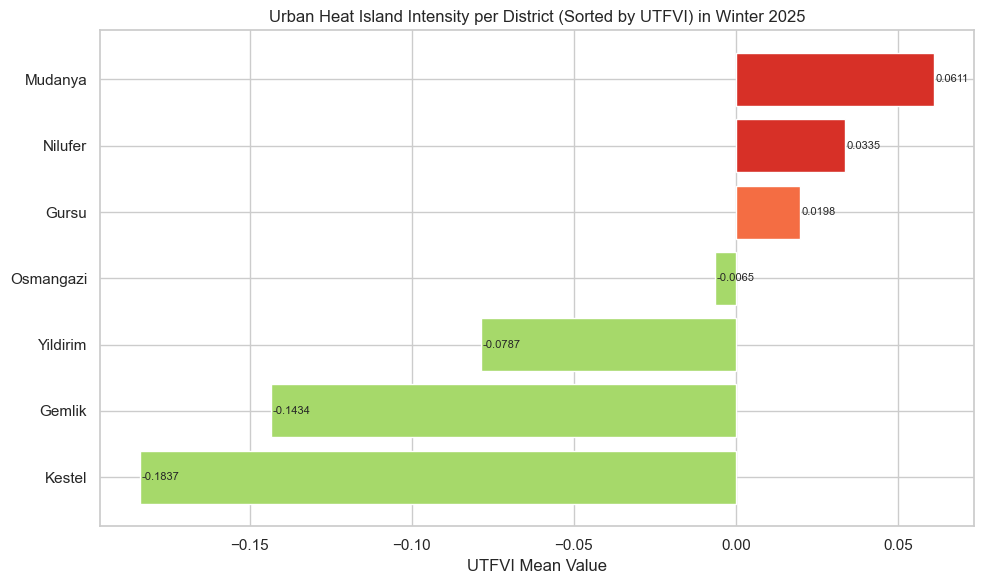

In [45]:
# Sort DataFrame by mean UTFVI (descending)
df_sorted_winter = df_result_winter.sort_values("mean", ascending=False)

# Optional: set seaborn style
sns.set(style="whitegrid")

# Create color palette based on UHI class
color_map = {
    "Low": "#a6d96a",
    "Weak": "#d9ef8b",
    "Middle": "#ffffbf",
    "Strong": "#fdae61",
    "Stronger": "#f46d43",
    "Strongest": "#d73027",
    "Undefined": "#cccccc"
}

colors = df_sorted_winter["uhi_phenomenon_winter"].map(color_map)

# Plot
plt.figure(figsize=(10, 6))
bars_winter = plt.barh(df_sorted_winter["NAME"], df_sorted_winter["mean"], color=colors)

plt.xlabel("UTFVI Mean Value")
plt.title("Urban Heat Island Intensity per District (Sorted by UTFVI) in Winter 2025")

# Reverse y-axis so highest value on top
plt.gca().invert_yaxis()

# Optional: add value labels
for bar_winter, value_winter in zip(bars_winter, df_sorted_winter["mean"]):
    plt.text(bar_winter.get_width() + 0.0005, bar_winter.get_y() + bar_winter.get_height()/2,
             f"{value_winter:.4f}", va='center', fontsize=8)

plt.tight_layout()
plt.show()


#### Summer 2025 Analysis

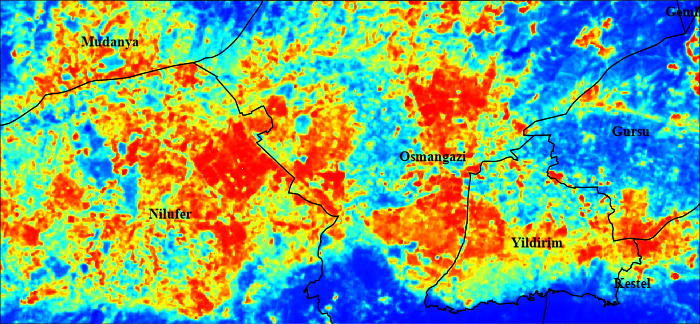

In [46]:
# Visualize the UTFVI map for summer and Bursa City's district
map_summer = gj.Map(use_region=True, width=700)
map_summer.d_rast(map="utfvi_summer_2025")
map_summer.d_vect(map="bursa_district",
                  color="black",
                  fill_color="none",
                  attribute_column="NAME",
                  width=1,
                  label_color="black",
                  label_size=10,
                  font="timesbd",
                  xref="center",
                  yref="center")
map_summer.show()

In [47]:
# Get zonal statistics from GRASS
stats_summer = gs.read_command("r.univar",
                        flags="t",
                        map="utfvi_summer_2025",
                        zones="bursa_district",
                        separator="comma")
df_stats_summer = pd.read_csv(StringIO(stats_summer))

# Get district names
attributes_summer = gs.read_command("v.db.select",
                             map="bursa_district",
                             columns="cat,NAME",
                             separator="comma",
                             format="csv")
df_names_summer = pd.read_csv(StringIO(attributes_summer))

# Merge stats with names
df_final_summer = pd.merge(df_stats_summer,
                           df_names_summer,
                           left_on="zone",  # From r.univar output
                           right_on="cat",  # From v.db.select
                           how="left")
df_final_summer

,zone,label,non_null_cells,null_cells,min,max,range,mean,mean_of_abs,stddev,variance,coeff_var,sum,sum_abs,cat,NAME
0,1,NaN,59087884,0,-0.244488,0.244988,0.489476,0.014713,0.052978,0.064937,0.004217,441.354595,8.693708e+05,3.130335e+06,1,Yildirim
1,2,NaN,61322111,0,-0.242651,0.210623,0.453275,-0.045880,0.073841,0.072585,0.005269,-158.205484,-2.813480e+06,4.528091e+06,2,Gursu
2,3,NaN,1204259,0,-0.255735,0.077334,0.333070,-0.177959,0.178511,0.048841,0.002385,-27.444886,-2.143091e+05,2.149731e+05,3,Gemlik
3,4,NaN,227790322,0,-0.345319,0.305007,0.650326,-0.006880,0.074840,0.095819,0.009181,-1392.634702,-1.567289e+06,1.704790e+07,4,Osmangazi
4,5,NaN,53656365,0,-0.224599,0.205006,0.429605,0.003917,0.055652,0.068654,0.004713,1752.836993,2.101581e+05,2.986062e+06,5,Mudanya
5,6,NaN,193913369,0,-0.270076,0.363799,0.633876,0.030582,0.061589,0.069166,0.004784,226.167955,5.930232e+06,1.194287e+07,6,Nilufer
6,7,NaN,25608849,0,-0.332786,0.238153,0.570938,-0.094161,0.131726,0.127766,0.016324,-135.689110,-2.411344e+06,3.373364e+06,7,Kestel


In [48]:
# Visualize only selected column
df_result_summer = df_final_summer[["cat", "NAME", "mean"]].copy()
df_result_summer

,cat,NAME,mean
0,1,Yildirim,0.014713
1,2,Gursu,-0.045880
2,3,Gemlik,-0.177959
3,4,Osmangazi,-0.006880
4,5,Mudanya,0.003917
5,6,Nilufer,0.030582
6,7,Kestel,-0.094161


In [49]:
# UHI phenomenon in summer 2025 based on UTFVI value
def classify_utfvi(value):
    if value < 0:
        return "Low"
    elif 0 < value < 0.005:
        return "Weak"
    elif 0.005 <= value < 0.010:
        return "Middle"
    elif 0.010 <= value < 0.015:
        return "Strong"
    elif 0.015 <= value < 0.020:
        return "Stronger"
    elif value >= 0.020:
        return "Strongest"
    else:
        return "Undefined"
df_result_summer["uhi_phenomenon_summer"] = df_result_summer["mean"].apply(classify_utfvi)
df_result_summer

,cat,NAME,mean,uhi_phenomenon_summer
0,1,Yildirim,0.014713,Strong
1,2,Gursu,-0.045880,Low
2,3,Gemlik,-0.177959,Low
3,4,Osmangazi,-0.006880,Low
4,5,Mudanya,0.003917,Weak
5,6,Nilufer,0.030582,Strongest
6,7,Kestel,-0.094161,Low


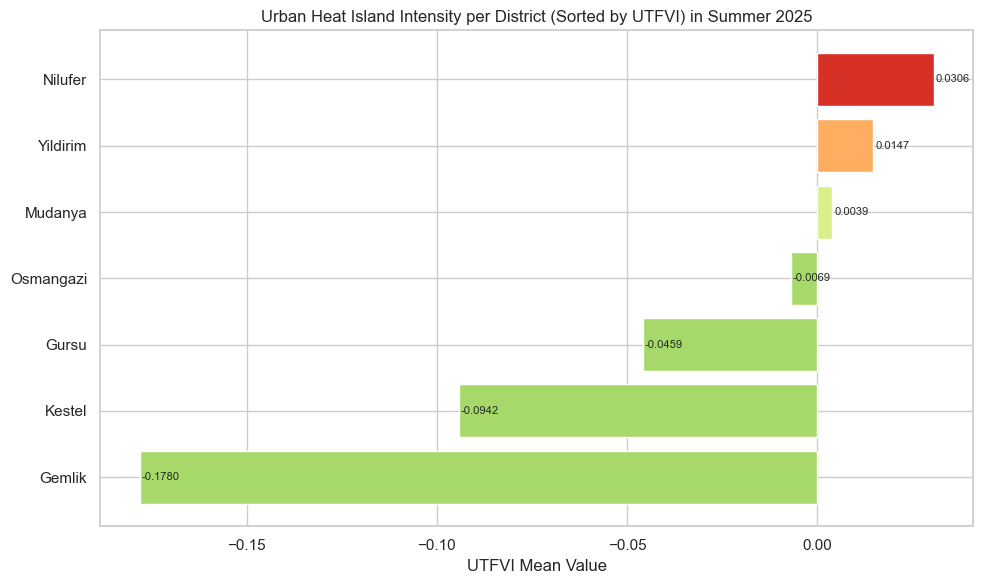

In [50]:
# Sort DataFrame by mean UTFVI (descending)
df_sorted_summer = df_result_summer.sort_values("mean", ascending=False)

# Optional: set seaborn style
sns.set(style="whitegrid")

# Create color palette based on UHI class
color_map = {
    "Low": "#a6d96a",
    "Weak": "#d9ef8b",
    "Middle": "#ffffbf",
    "Strong": "#fdae61",
    "Stronger": "#f46d43",
    "Strongest": "#d73027",
    "Undefined": "#cccccc"
}

colors = df_sorted_summer["uhi_phenomenon_summer"].map(color_map)

# Plot
plt.figure(figsize=(10, 6))
bars_summer = plt.barh(df_sorted_summer["NAME"], df_sorted_summer["mean"], color=colors)

plt.xlabel("UTFVI Mean Value")
plt.title("Urban Heat Island Intensity per District (Sorted by UTFVI) in Summer 2025")

# Reverse y-axis so highest value on top
plt.gca().invert_yaxis()

# Optional: add value labels
for bar_summer, value_summer in zip(bars_summer, df_sorted_summer["mean"]):
    plt.text(bar_summer.get_width() + 0.0005, bar_summer.get_y() + bar_summer.get_height()/2,
             f"{value_summer:.4f}", va='center', fontsize=8)

plt.tight_layout()
plt.show()

### References

1. Akın, A., & Erdoğan, M. A. (2020). Analysing temporal and spatial urban sprawl change of Bursa city using landscape metrics and remote sensing. *Modeling Earth Systems and Environment, 6*, 1331–1343.

2. Anderson, J. R. (1976). *A land use and land cover classification system for use with remote sensor data* (Vol. 964). US Government Printing Office.

3. Attri, P., Chaudhry, S., & Sharma, S. (2015). Remote sensing & GIS based approaches for LULC change detection—A review. *International Journal of Current Engineering and Technology, 5*, 3126–3137.

4. Avdan, U., & Jovanovska, G. (2016). Algorithm for automated mapping of land surface temperature using LANDSAT 8 satellite data. *Journal of Sensors, 2016*, 1–8.

5. Bendib, A., Dridi, H., & Kalla, M. I. (2017). Contribution of Landsat 8 data for the estimation of land surface temperature in Batna city, Eastern Algeria. *Geocarto International, 32*(5), 503–513.

6. Global Land Project (GLP). (2005). *Science Plan and Implementation Strategy*. IGBP Report No. 53 / IHDP Report No. 19. IGBP Secretariat, Stockholm.

7. Kaplan, G., Avdan, U., & Avdan, Z. Y. (2018, March). Urban heat island analysis using the Landsat 8 satellite data: A case study in Skopje, Macedonia. In *Proceedings* (Vol. 2, No. 7, p. 358). MDPI.

8. Latif, M. S. (2014). Land surface temperature retrieval of Landsat-8 data using split window algorithm—A case study of Ranchi District. *International Journal of Engineering Development and Research, 2*(4), 2840–3849.

9. Meyer, W. B., & Turner, B. L. II (Eds.). (1994). *Changes in land use and land cover: A global perspective* (Vol. 4). Cambridge University Press.

10. Naim, M. N. H., & Kafy, A. A. (2021). Assessment of urban thermal field variance index and defining the relationship between land cover and surface temperature in Chattogram city: A remote sensing and statistical approach. *Environmental Challenges, 4*, 100107.

11. Renard, F., Alonso, L., Fitts, Y., Hadjiosif, A., & Comby, J. (2019). Evaluation of the effect of urban redevelopment on surface urban heat islands. *Remote Sensing, 11*(3), 299.

12. Rockström, J., Steffen, W., Noone, K., Persson, Å., Chapin, F. S., Lambin, E. F., ... & Foley, J. A. (2009). A safe operating space for humanity. *Nature, 461*(7263), 472–475.

13. Schwarz, N., Lautenbach, S., & Seppelt, R. (2011). Exploring indicators for quantifying surface urban heat islands of European cities with MODIS land surface temperatures. *Remote Sensing of Environment, 115*(12), 3175–3186.

14. Streutker, D. R. (2003). Satellite-measured growth of the urban heat island of Houston, Texas. *Remote Sensing of Environment, 85*(3), 282–289.

15. Talukdar, S., Singha, P., Mahato, S., Pal, S., Liou, Y. A., & Rahman, A. (2020). Land-use land-cover classification by machine learning classifiers for satellite observations—A review. *Remote Sensing, 12*(7), 1135.

16. Yeke, S. T., Durak, S., & Arslan, T. V. (2016). Industrialization and Bursa, the evolving city: Changes in housing character after 1960. *International Journal of Social Science and Humanity, 6*(8), 617.

17. Zuo, D. K. (1990). *A dictionary of modern geography*. The Commercial Press, 485.
